# Bagging for data valuation

This notebook introduces the Data-OOB method, an implementation based on a publication from Kwon and Zou "Data-OOB: Out-of-bag Estimate as a Simple and Efficient Data Value" ICML 2023 , using pyDVL.
https://proceedings.mlr.press/v202/kwon23e.html

The objective of this paper is mainly to overcome the computational bottleneck of shapley-based data valuation methods that require to fit a significant number of models to accurately estimate marginal contributions.
The algorithms computes data values from out of bag estimates using a bagging model.

The value can be interpreted as a partition of the OOB estimate, which is originally introduced to estimate the prediction error. This OOB estimate is given as:

$$
\sum_{i=1}^n\frac{\sum_{b=1}^{B}\mathbb{1}(w_{bi}=0)T(y_i, \hat{f}_b(x_i))}{\sum_{b=1}^{B}
\mathbb{1}
(w_{bi}=0)}
$$


## Setup

We begin by importing the main libraries and setting some defaults.

<div class="alert alert-info">

If you are reading this in the documentation, some boilerplate (including most plotting code) has been omitted for convenience.

</div>

In [2]:
%load_ext autoreload

In [3]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression

import matplotlib.pyplot as plt
import numpy as np

from pydvl.value import compute_data_oob
from pydvl.utils import Dataset, Utility, Scorer
from pydvl.reporting.scores import compute_removal_score
from pydvl.reporting.plots import shaded_mean_std
from pydvl.value.result import ValuationResult

In [4]:

from sklearn.datasets import load_iris, fetch_kddcup99, fetch_openml
import pandas as pd

In [5]:
#for dataset_name in ["glass", "wdbc", "cardiotocography"][-1:]:
dataset = fetch_openml(
    name="wdbc", version=1, as_frame=False, parser="pandas"
)
data = Dataset.from_sklearn(dataset)

In [6]:

#model = KNeighborsClassifier(n_neighbors=5)
model = DecisionTreeClassifier(max_depth=5,)
#model = LogisticRegression()
utility = Utility(model, data, Scorer("accuracy", default=0.0))

# Varying cardinality

# Varying number of estimators

In [7]:
all_best_scores = []
all_worst_scores = []

removal_percentages = np.arange(0, 0.99, 0.01)

n_est = 300
max_samples = 0.4
n_iter = 5
progress = True
for i in range(n_iter):
    if(i==1):
        progress = False
    for n_est in [10,20,50, 100, 200, 1000]:
        method_name = f"oob_{n_est}"
        values = compute_data_oob(utility, n_est=n_est, max_samples=max_samples, progress=progress)

        best_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=True,
        )
        best_scores["method_name"] = method_name
        all_best_scores.append(best_scores)
        
        worst_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=False,
        )
        worst_scores["method_name"] = method_name
        all_worst_scores.append(worst_scores)

best_scores_df = pd.DataFrame(all_best_scores)
worst_scores_df = pd.DataFrame(all_worst_scores)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [8]:
import seaborn as sns

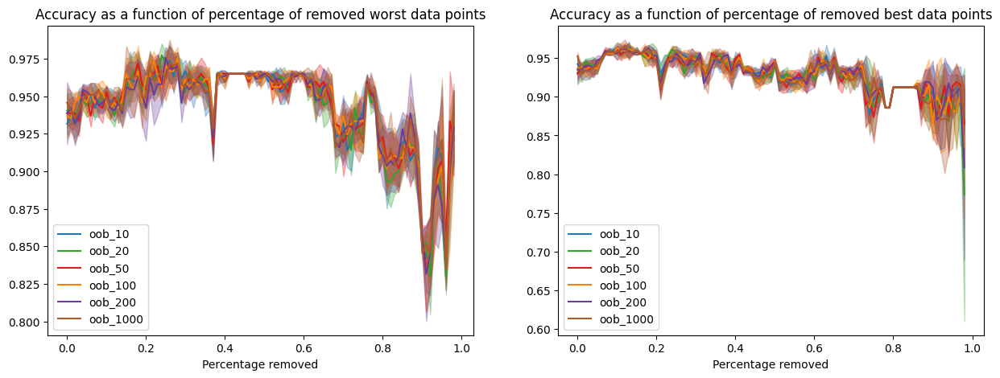

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=[15,5])



for i, n_est in enumerate([10,20,50, 100, 200, 1000]):
    method_name = f"oob_{n_est}"
    shaded_mean_std(
        best_scores_df[best_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        shade_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed best data points",
        ax=ax[1],
    )
    shaded_mean_std(
        worst_scores_df[worst_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        shade_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed worst data points",
        ax=ax[0],
    )
ax[0].legend();
ax[1].legend();
plt.show();

# Varying number of samples in bag

In [10]:
all_best_scores = []
all_worst_scores = []

removal_percentages = np.arange(0, 0.99, 0.01)

n_est = 100
max_samples = 0.4
n_iter = 10
progress = True
for i in range(n_iter):
    if(i==1):
        progress = False
    for max_samples in np.arange(0.1,0.90,0.1):
        method_name = f"oob_{max_samples:.2f}"
        values = compute_data_oob(utility, n_est=n_est, max_samples=max_samples, progress=progress)

        best_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=True,
        )
        best_scores["method_name"] = method_name
        all_best_scores.append(best_scores)
        
        worst_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=False,
        )
        worst_scores["method_name"] = method_name
        all_worst_scores.append(worst_scores)

best_scores_df = pd.DataFrame(all_best_scores)
worst_scores_df = pd.DataFrame(all_worst_scores)

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

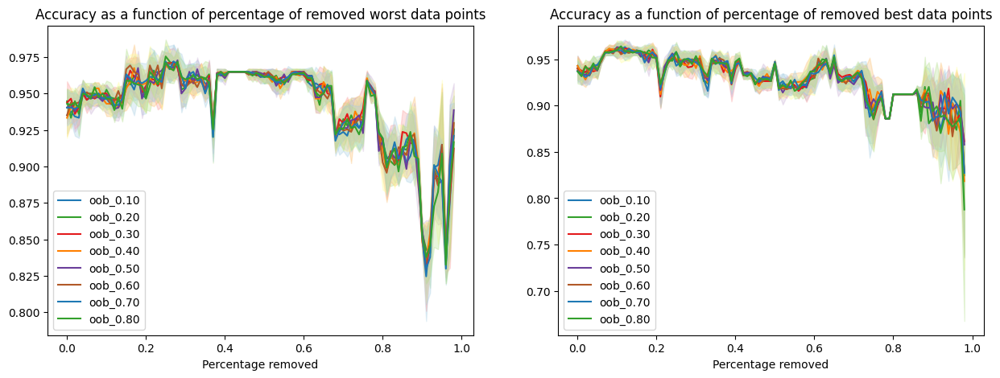

In [11]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=[15,5])


for i,max_samples in enumerate(np.arange(0.1,0.90,0.1)):
    method_name = f"oob_{max_samples:.2f}"
    shaded_mean_std(
        best_scores_df[best_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        shade_color=sns.color_palette("Paired")[(2*i) %len(sns.color_palette("Paired"))],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed best data points",
        ax=ax[1],
    )
    shaded_mean_std(
        worst_scores_df[worst_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        shade_color=sns.color_palette("Paired")[(2*i) %len(sns.color_palette("Paired"))],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed worst data points",
        ax=ax[0],
    )
ax[0].legend();
ax[1].legend();
plt.show();

In [12]:

mean_colors = ["dodgerblue", "indianred", "limegreen", "darkorange", "darkorchid"]
shade_colors = ["lightskyblue", "firebrick", "seagreen", "gold", "plum"]

In [13]:
from pydvl.value import compute_shapley_values
from pydvl.value.shapley import ShapleyMode, RelativeTruncation
from pydvl.value.stopping import AbsoluteStandardError, MaxUpdates

In [14]:
from pydvl.value.loo import compute_loo

In [15]:
from time import time

In [16]:
all_best_scores = []
all_worst_scores = []

removal_percentages = np.arange(0, 0.45, 0.01)

for i in range(5):
    for method_name in ["Random","OOB","TMTC", "LOO"]:
        if method_name == "Random":
            values = ValuationResult.from_random(size=len(utility.data))
        elif method_name == "OOB":
            values = compute_data_oob(utility, n_est=300, max_samples=0.4, progress=True)
#        elif method_name == "KNN":
#            values = compute_shapley_values(utility, mode=ShapleyMode.KNN, progress=True)
        elif method_name == "TMTC":
            values = compute_shapley_values(
                        utility,
                        mode=ShapleyMode.TruncatedMontecarlo,
                        done=AbsoluteStandardError(threshold=0.2, fraction=0.9) | MaxUpdates(1000),
                        truncation=RelativeTruncation(utility, rtol=0.01),
                        n_jobs=-1,)
        elif method_name == "LOO":
            values = compute_loo(utility, n_jobs=-1)

        best_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=True,
        )
        best_scores["method_name"] = method_name
        all_best_scores.append(best_scores)
        
        worst_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=False,
        )
        worst_scores["method_name"] = method_name
        all_worst_scores.append(worst_scores)

best_scores_df = pd.DataFrame(all_best_scores)
worst_scores_df = pd.DataFrame(all_worst_scores)

  0%|          | 0/300 [00:00<?, ?it/s]

Cancellation of futures is not supported by the joblib backend
Cancellation of futures is not supported by the joblib backend
100%|█████████▉| 99.78021978021978/100 [00:06<00:00, 14.61%/s]  


  0%|          | 0/300 [00:00<?, ?it/s]

Cancellation of futures is not supported by the joblib backend
Cancellation of futures is not supported by the joblib backend
100%|█████████▉| 99.56043956043956/100 [00:07<00:00, 12.74%/s]  


  0%|          | 0/300 [00:00<?, ?it/s]

Cancellation of futures is not supported by the joblib backend
Cancellation of futures is not supported by the joblib backend
100%|█████████▉| 99.78021978021978/100 [00:07<00:00, 13.42%/s]  


  0%|          | 0/300 [00:00<?, ?it/s]

Cancellation of futures is not supported by the joblib backend
Cancellation of futures is not supported by the joblib backend
100%|█████████▉| 99.78021978021978/100 [00:08<00:00, 11.54%/s]  


  0%|          | 0/300 [00:00<?, ?it/s]

Cancellation of futures is not supported by the joblib backend
Cancellation of futures is not supported by the joblib backend
100%|█████████▉| 99.78021978021978/100 [00:07<00:00, 12.72%/s]  


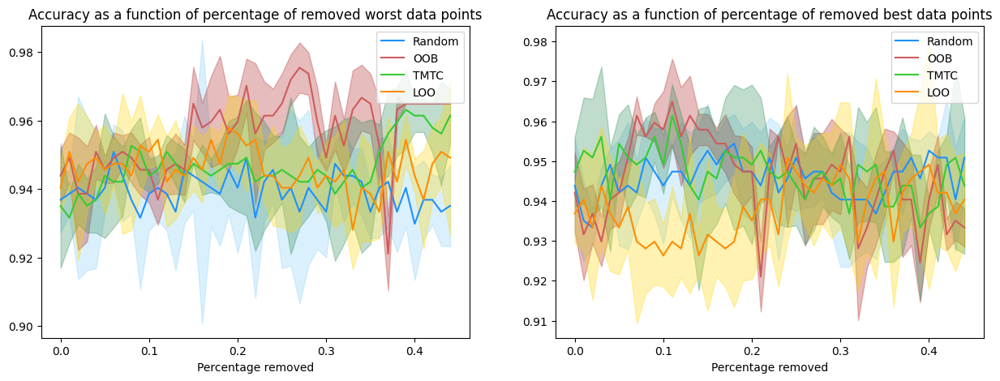

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=[15,5])

for i, method_name in enumerate(["Random","OOB","TMTC", "LOO"]):
    shaded_mean_std(
        best_scores_df[best_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=mean_colors[i],
        shade_color=shade_colors[i],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed best data points",
        ax=ax[1],
    )
    shaded_mean_std(
        worst_scores_df[worst_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=mean_colors[i],
        shade_color=shade_colors[i],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed worst data points",
        ax=ax[0],
    )
ax[0].legend();
ax[1].legend();
plt.show();

# Comparing various models

In [18]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.gaussian_process.kernels import RBF

In [19]:
from lightgbm import LGBMClassifier

In [20]:

model = KNeighborsClassifier(n_neighbors=5)
model = DecisionTreeClassifier(max_depth=2,)
model = LogisticRegression()
scorer = Scorer("accuracy", default=0.0)
dict_utilities = {}
utility = Utility(KNeighborsClassifier(n_neighbors=5), data, scorer)
dict_utilities["KNN"] = utility
utility = Utility(DecisionTreeClassifier(max_depth=2,), data, scorer)
dict_utilities["DecisionTreeShallow"] = utility
utility = Utility(DecisionTreeClassifier(max_depth=20,), data, scorer)
dict_utilities["DecisionTreeDeep"] = utility
#utility = Utility(GaussianProcessClassifier(1.0 * RBF(1.0)), data, scorer)
#dict_utilities["GaussianProcess"] = utility
#utility = Utility(GaussianNB(), data, scorer)
#dict_utilities["GaussianNB"] = utility
#utility = Utility(MLPClassifier(), data, scorer)
#dict_utilities["MLPClassifier"] = utility
utility = Utility(RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1), data, scorer)
dict_utilities["RandomForest"] = utility
utility = Utility(AdaBoostClassifier(), data, scorer)
dict_utilities["AdaBoost"] = utility
#utility_lr = Utility(LogisticRegression(), data, scorer)
#dict_utilities["KNN"] = utility_knn
utility = Utility(LGBMClassifier(), data, scorer)
dict_utilities["LGBM"] = utility

dict_utilities.keys()

dict_keys(['KNN', 'DecisionTreeShallow', 'DecisionTreeDeep', 'RandomForest', 'AdaBoost', 'LGBM'])

In [21]:
all_best_scores = []
all_worst_scores = []

removal_percentages = np.arange(0, 0.99, 0.01)

n_est = 20
max_samples = 0.4
n_iter = 5
progress = True
for i in range(n_iter):
    if(i>0):
        progress = False
    for method_name, utility in  dict_utilities.items():
        if(i==0):
            print(method_name)
        values = compute_data_oob(utility, n_est=n_est, max_samples=max_samples, progress=progress)

        best_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=True,
        )
        best_scores["method_name"] = method_name
        all_best_scores.append(best_scores)
        
        worst_scores = compute_removal_score(
            u=utility,
            values=values,
            percentages=removal_percentages,
            remove_best=False,
        )
        worst_scores["method_name"] = method_name
        all_worst_scores.append(worst_scores)

best_scores_df = pd.DataFrame(all_best_scores)
worst_scores_df = pd.DataFrame(all_worst_scores)

KNN


  0%|          | 0/20 [00:00<?, ?it/s]

DecisionTreeShallow


  0%|          | 0/20 [00:00<?, ?it/s]

DecisionTreeDeep


  0%|          | 0/20 [00:00<?, ?it/s]

RandomForest


  0%|          | 0/20 [00:00<?, ?it/s]

AdaBoost


  0%|          | 0/20 [00:00<?, ?it/s]

LGBM
[LightGBM] [Info] Number of positive: 164, number of negative: 291
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4542
[LightGBM] [Info] Number of data points in the train set: 455, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.428571 -> initscore=-0.287682
[LightGBM] [Info] Start training from score -0.287682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

  0%|          | 0/20 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 164, number of negative: 291
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000375 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4542
[LightGBM] [Info] Number of data points in the train set: 455, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.360440 -> initscore=-0.573457
[LightGBM] [Info] Start training from score -0.573457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

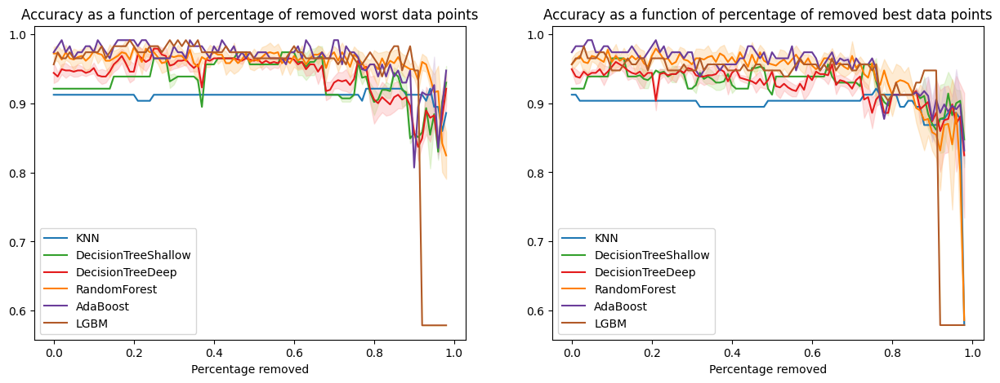

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=[15,5])

for i, method_name in enumerate(dict_utilities.keys()):
    shaded_mean_std(
        best_scores_df[best_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        shade_color=sns.color_palette("Paired")[(2*i) %len(sns.color_palette("Paired"))],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed best data points",
        ax=ax[1],
    )
    shaded_mean_std(
        worst_scores_df[worst_scores_df["method_name"] == method_name].drop(
            columns=["method_name"]
        ),
        abscissa=removal_percentages,
        mean_color=sns.color_palette("Paired")[(2*i+1) %len(sns.color_palette("Paired"))],
        shade_color=sns.color_palette("Paired")[(2*i) %len(sns.color_palette("Paired"))],
        xlabel="Percentage removed",
        #ylabel=utility.scorer._name.capitalize(),
        label=method_name,
        title="Accuracy as a function of percentage of removed worst data points",
        ax=ax[0],
    )
ax[0].legend();
ax[1].legend();
plt.show();

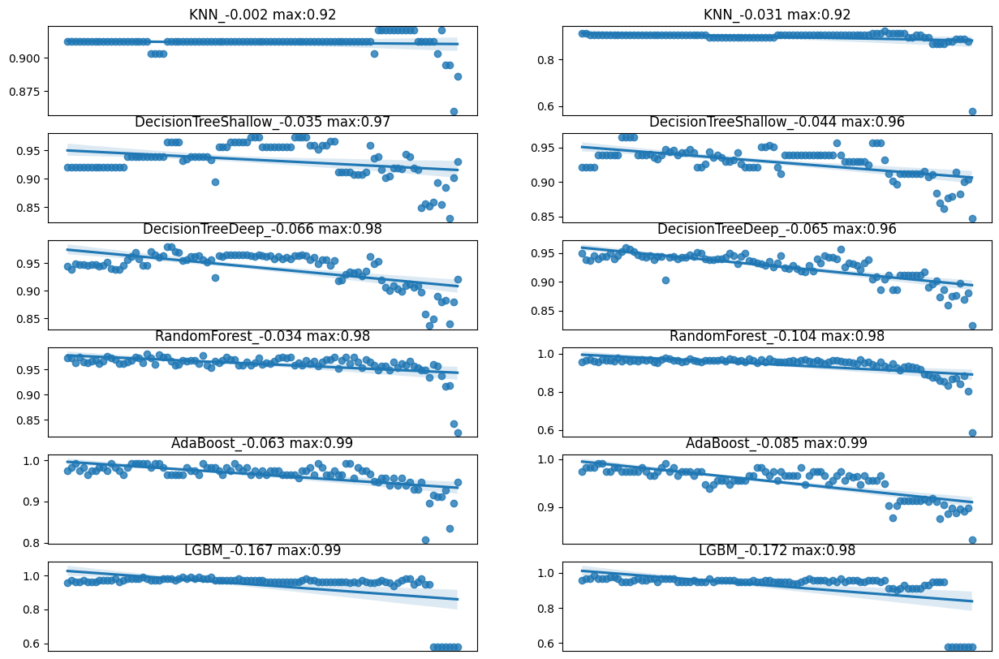

In [23]:
fig, ax = plt.subplots(ncols=2, nrows=best_scores_df.method_name.nunique(), figsize = [15,10])
for i, x in enumerate(best_scores_df.method_name.unique()):
    p=sns.regplot(x=np.arange(len(best_scores_df.groupby("method_name").mean().values[i])), y =best_scores_df.groupby("method_name").mean().loc[x].values, ax=ax[i,1])
    y_data = p.get_lines()[0].get_ydata()
    maxi = best_scores_df.groupby("method_name").mean().loc[x].max()
    ax[i,1].set_title(f"{x}_{y_data[-1]-y_data[0]:.3f} max:{maxi:.2f}")
    ax[i,1].set_xticks([])
    p=sns.regplot(x=np.arange(len(worst_scores_df.groupby("method_name").mean().values[i])), y =worst_scores_df.groupby("method_name").mean().loc[x].values, ax=ax[i,0])
    y_data = p.get_lines()[0].get_ydata()
    maxi = worst_scores_df.groupby("method_name").mean().loc[x].max()
    ax[i,0].set_title(f"{x}_{y_data[-1]-y_data[0]:.3f} max:{maxi:.2f}")
    ax[i,0].set_xticks([])

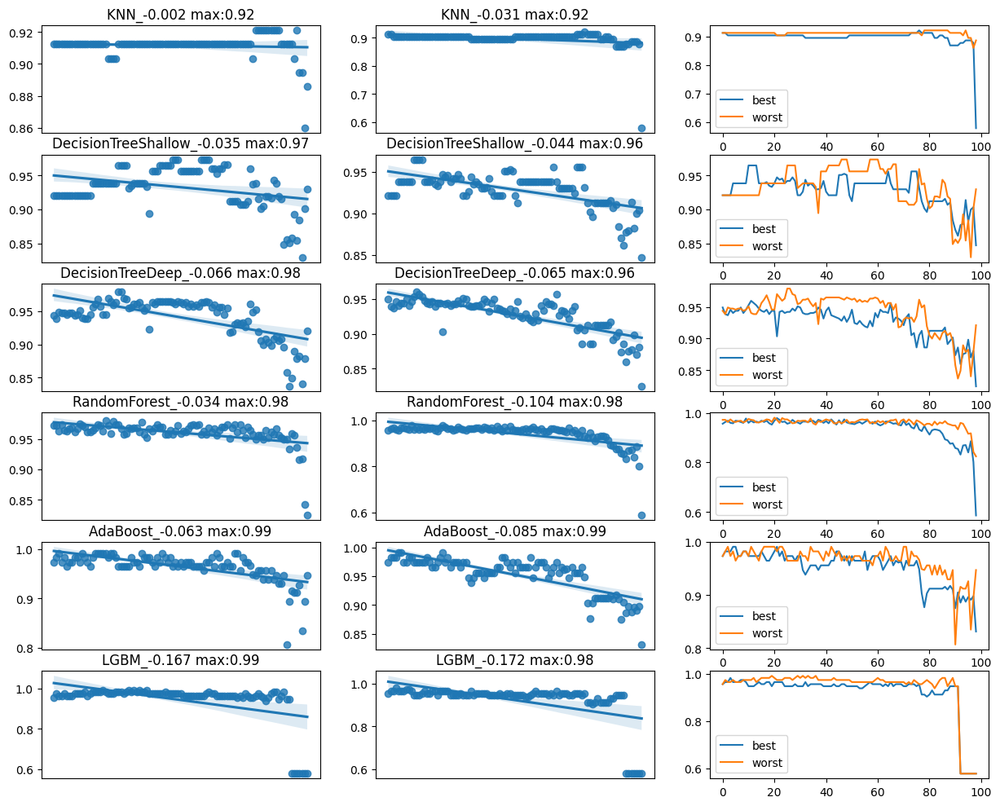

In [24]:
fig, ax = plt.subplots(ncols=3, nrows=best_scores_df.method_name.nunique(), figsize = [15,12])
for i, x in enumerate(best_scores_df.method_name.unique()):
    p=sns.lineplot(x=np.arange(len(best_scores_df.groupby("method_name").mean().values[i])), y =best_scores_df.groupby("method_name").mean().loc[x].values, ax=ax[i,2],label="best")
    p=sns.regplot(x=np.arange(len(best_scores_df.groupby("method_name").mean().values[i])), y =best_scores_df.groupby("method_name").mean().loc[x].values, ax=ax[i,1])
    y_data = p.get_lines()[0].get_ydata()
    maxi = best_scores_df.groupby("method_name").mean().loc[x].max()
    ax[i,1].set_title(f"{x}_{y_data[-1]-y_data[0]:.3f} max:{maxi:.2f}")
    ax[i,1].set_xticks([])
    p=sns.lineplot(x=np.arange(len(worst_scores_df.groupby("method_name").mean().values[i])), y =worst_scores_df.groupby("method_name").mean().loc[x].values, ax=ax[i,2],label='worst')
    p=sns.regplot(x=np.arange(len(worst_scores_df.groupby("method_name").mean().values[i])), y =worst_scores_df.groupby("method_name").mean().loc[x].values, ax=ax[i,0])
    y_data = p.get_lines()[0].get_ydata()
    maxi = worst_scores_df.groupby("method_name").mean().loc[x].max()
    ax[i,0].set_title(f"{x}_{y_data[-1]-y_data[0]:.3f} max:{maxi:.2f}")
    ax[i,0].set_xticks([])